In [1]:
! python -m pip install requests
! python -m pip install beautifulsoup4
! python -m pip install pillow

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [2]:
import requests
from bs4 import BeautifulSoup

## Get book links 

In [3]:
def extract_pages_urls(URL):
  page = requests.get(URL)
  soup = BeautifulSoup(page.content, "html.parser")
  pagination = soup.find('div', class_="pagination1")
  pages_urls = set()
  for page in pagination.find_all("a"):
    pages_urls.add(page.attrs['href'])
  return(pages_urls)

def extract_book_links(URL):
  page = requests.get(URL)
  soup = BeautifulSoup(page.content, "html.parser")
  results = soup.find_all(id="prod")
  book_links = set()
  for res in results:
    book = res.find("a", rel="noopener noreferrer")
    book_links.add(book.attrs['href'])
  return book_links

In [4]:
initial_URL = "https://monkeypen.com/pages/free-childrens-books/"

all_book_links = set()
for URL in extract_pages_urls(initial_URL):
  all_book_links = all_book_links.union(extract_book_links(URL))

In [5]:
print(f'Hem aconseguit extreure {len(all_book_links)} links de llibres diferents')

Hem aconseguit extreure 50 links de llibres diferents


## Get book text and images

In [49]:
def clean_txt(txt, remove_list=['\xa0', '<strong>', '</strong>', '<br/>']):
  for element in remove_list:
    txt = txt.replace(element, '')
  clean_txt = txt.strip()
  return clean_txt

def get_text(res_line):
  try:
    text = '\n'.join([str(cont.text) for cont in res_line.contents if str(cont.text) != '<br/>'])
  except:
    text = '\n'.join([str(cont) for cont in res_line.contents if str(cont) != '<br/>'])
  finally:
    text = clean_txt(text)
  return text

def get_book(URL):
  page = requests.get(URL)
  book_soup = BeautifulSoup(page.content, "html.parser")
  is_book_active = False
  last_turn = 'image'
  book_txt = []
  book_img = []
  results = book_soup.find_all(['div', 'p'], style=['text-align: left;', 'text-align: start;',''])
  for res in results:
    # Check if the html is book story
    if (
      (res.name == 'p') and
      (len(res.contents) > 0)
    ):
      if (
        (
          ('contents' in vars(res.contents[0]).keys()) and
          (len(res.contents[0].contents) > 1) and
          (any(str(cont).find('Click here to read more Free') != -1 for cont in res.contents[0].contents))
        ) or
          any(str(cont).find('Click here to read more Free') != -1 for cont in res.contents)
      ):
        is_book_active = True
        continue
      elif (
        (
          ('contents' in vars(res.contents[0]).keys()) and
          (len(res.contents[0].contents) > 1) and
          (any(str(cont).find('Please share our books') != -1 for cont in res.contents[0].contents))
        ) or
          any(str(cont).find('Please share our books') != -1 for cont in res.contents)
      ):
        is_book_active = False
        break
  
    if is_book_active: # Book pages html
      # Check images
      if (
        (len(res.contents) > 0) and 
        (
          ('attrs' in vars(res.contents[0]).keys()) and
          ('src' in res.contents[0].attrs.keys())
        ) or
        (
          (len(res.contents) > 1) and
          ('attrs' in vars(res.contents[1]).keys()) and
          ('src' in res.contents[1].attrs.keys())
        )
      ): # Extract image link
        try:
          image_link = res.contents[0]['src']
        except:
          image_link = res.contents[1]['src']
        book_img.append(image_link)
        last_turn = 'image'
      elif (
        (len(res.contents) > 0) and 
        (
          ('contents' in vars(res.contents[0]).keys()) and
          (len(res.contents[0].contents) > 0) and
          ('attrs' in vars(res.contents[0].contents[0]).keys()) and
          ('src' in res.contents[0].contents[0].attrs.keys())  
        )
      ): # Extract image link
        image_link = res.contents[0].contents[0]['src']
        book_img.append(image_link)
        last_turn = 'image'

      # Extract text
      else: 
        text = get_text(res)
        if len(text) > 0:
          if last_turn == 'text': # Add to previous text chunk
            book_txt[-1] += '\n' + text
          else: # Add as new text chunk
            book_txt.append(text)
            last_turn = 'text'

  return {'book_txt': book_txt[:], 'book_img': book_img[1:]} # The first image is book cover

In [50]:
books = []
for URL in all_book_links:
  book = get_book(URL)
  book_txt, book_img = book['book_txt'], book['book_img']  

  if abs(len(book_txt) - len(book_img)) > 2:
    continue # Too much differece

  elif len(book_txt) - len(book_img) >= 1:
    while len(book_txt) - len(book_img) != 0:
      book_txt.pop() # Correct extra txt
  
  elif len(book_img) - len(book_txt) >= 1:
    while len(book_img) - len(book_txt) != 0:
      book_img.pop() # Correct extra img

  book = {'book_txt': book_txt, 'book_img': book_img, 'book_url': URL}
  books.append(book)
 
print(len(books), 'books!')

49 books!


## Data exploration

In [51]:
total_samples = 0
for book in books:
  total_samples += len(book['book_txt'])
print(f'Num samples: {total_samples}')

Num samples: 777


Example 0: book 4 (https://monkeypen.com/blogs/news/do-you-wonder-why-bugs-are-good-free-children-book), paragraph 8
Spined soldier bugs (stink bugs) feed on all sorts of garden pests. But don’t accidentally squish one of these, they really smell.


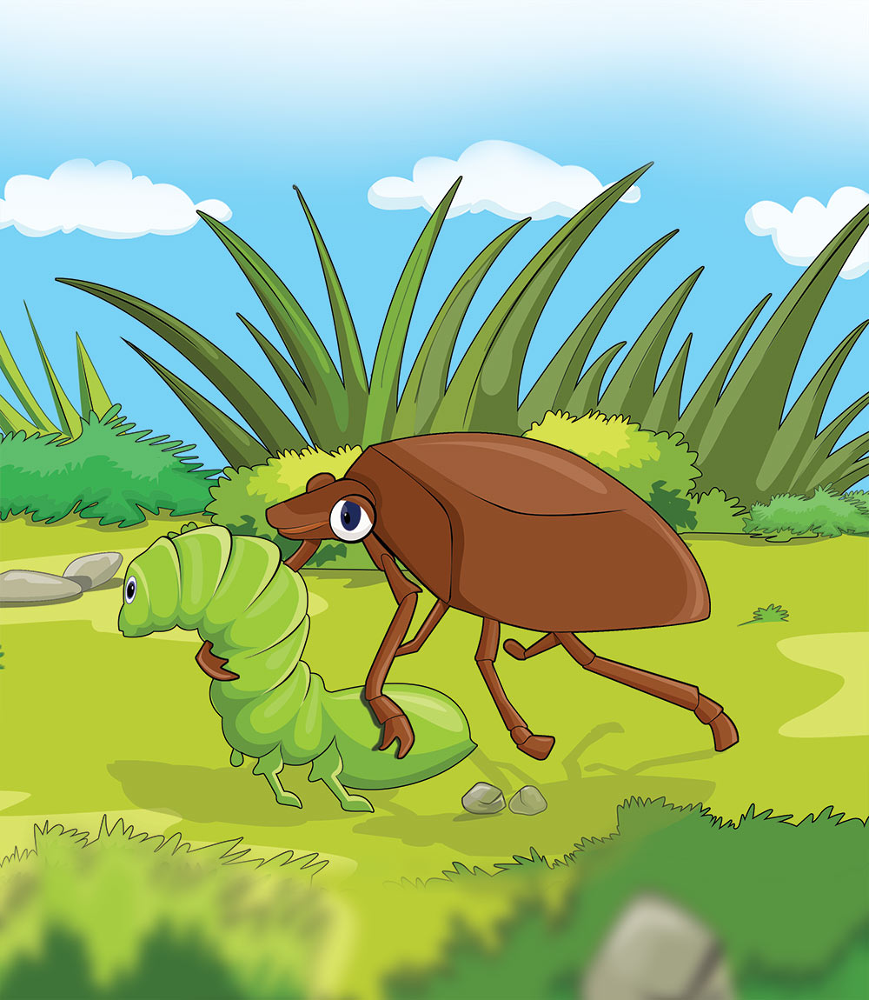

Example 1: book 23 (https://monkeypen.com/blogs/news/gabby-abby-free-children-book), paragraph 18
“Tristan, would you please come to the board and write the times 1 table for the class?” Miss Pinkerton said.


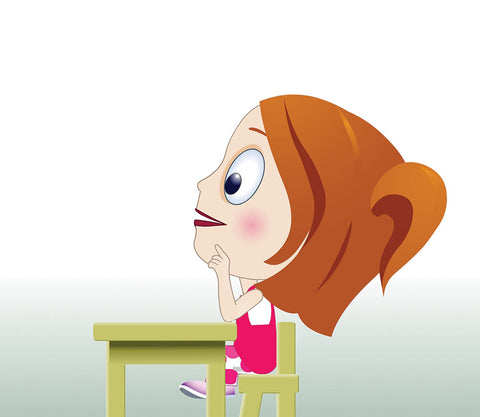

Example 2: book 9 (https://monkeypen.com/blogs/news/the-lunker-free-children-book), paragraph 0
On Monday, I went fishing with my dad.


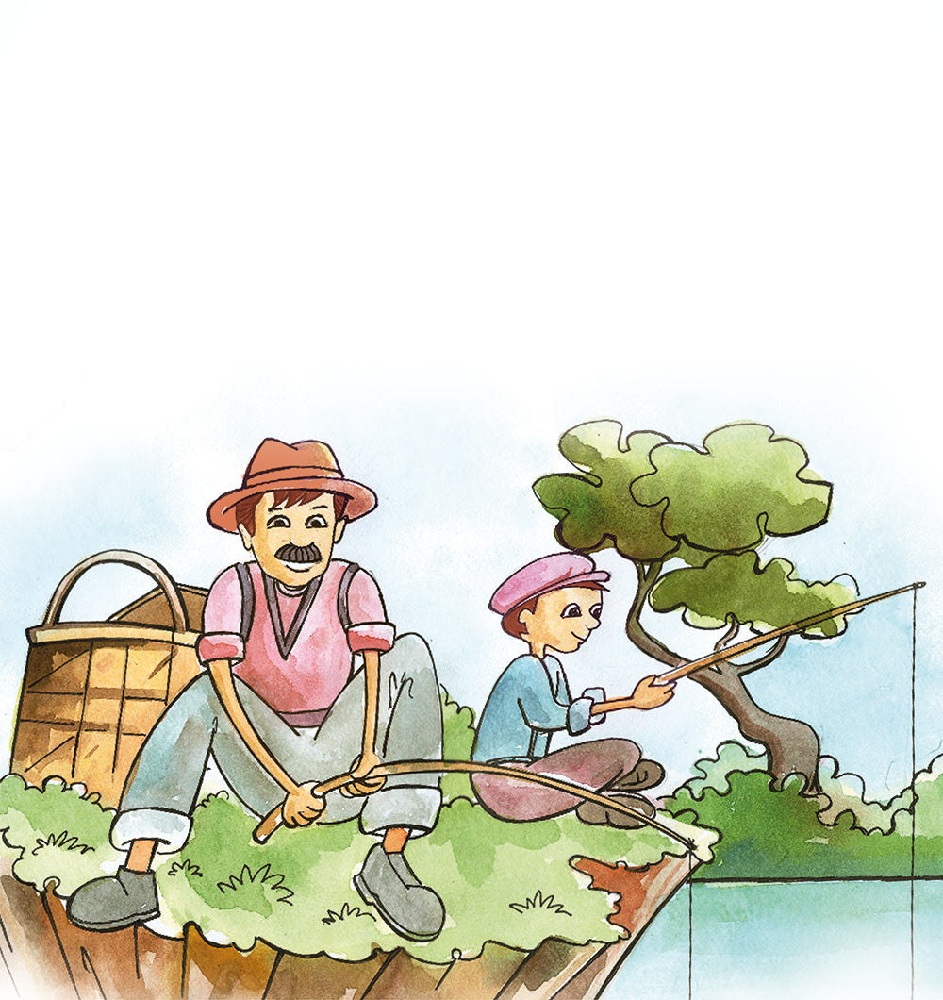

Example 3: book 25 (https://monkeypen.com/blogs/news/a-dog-on-a-log-free-children-book), paragraph 3
He must be saving that big, frightening flea.


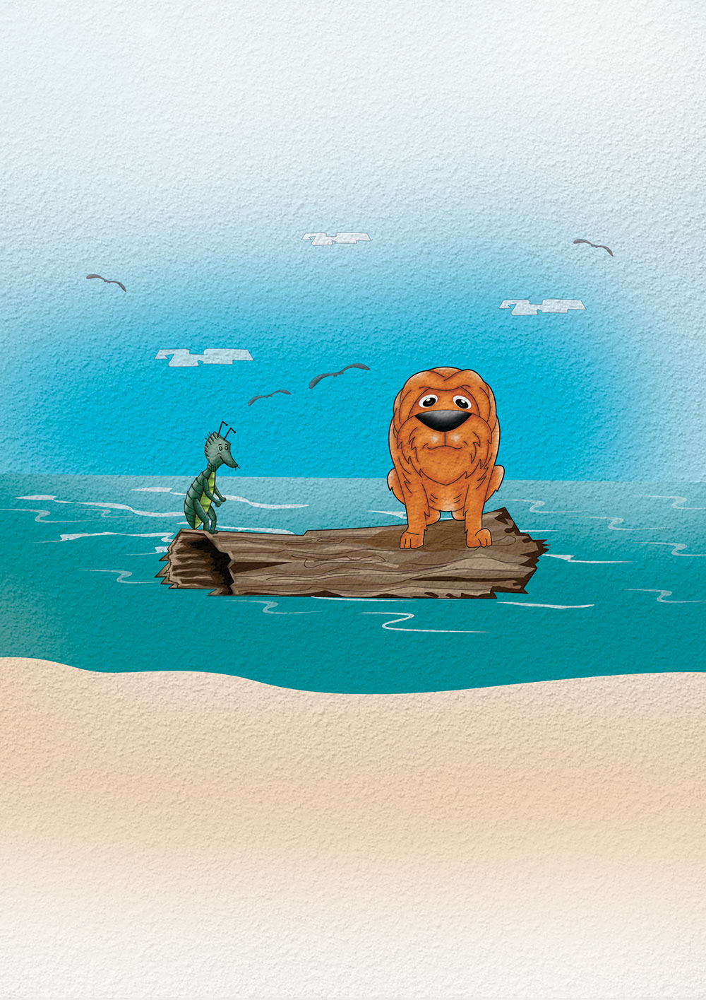

Example 4: book 0 (https://monkeypen.com/blogs/news/sunny-meadows-woodland-school), paragraph 0
The sun shone brightly over the meadow as Class 1 of Sunny Meadows Woodland School set off for their first trip to the Shadow Woods. Everyone was excited to be going on the adventure that they had been talking about for weeks. Their teacher, Miss Squirrel, had promised a trip to remember and the whole class now skipped excitedly through the meadow. Well, nearly all of the class; alone at the back of the group waddled Hank. Hank was a hedgehog who found it difficult to make friends. He always felt like the outsider. The others in the class, especially Matilda Mouse, kept away from Hank because they thought him odd. Yes, Hank was not really looking forward to the day.


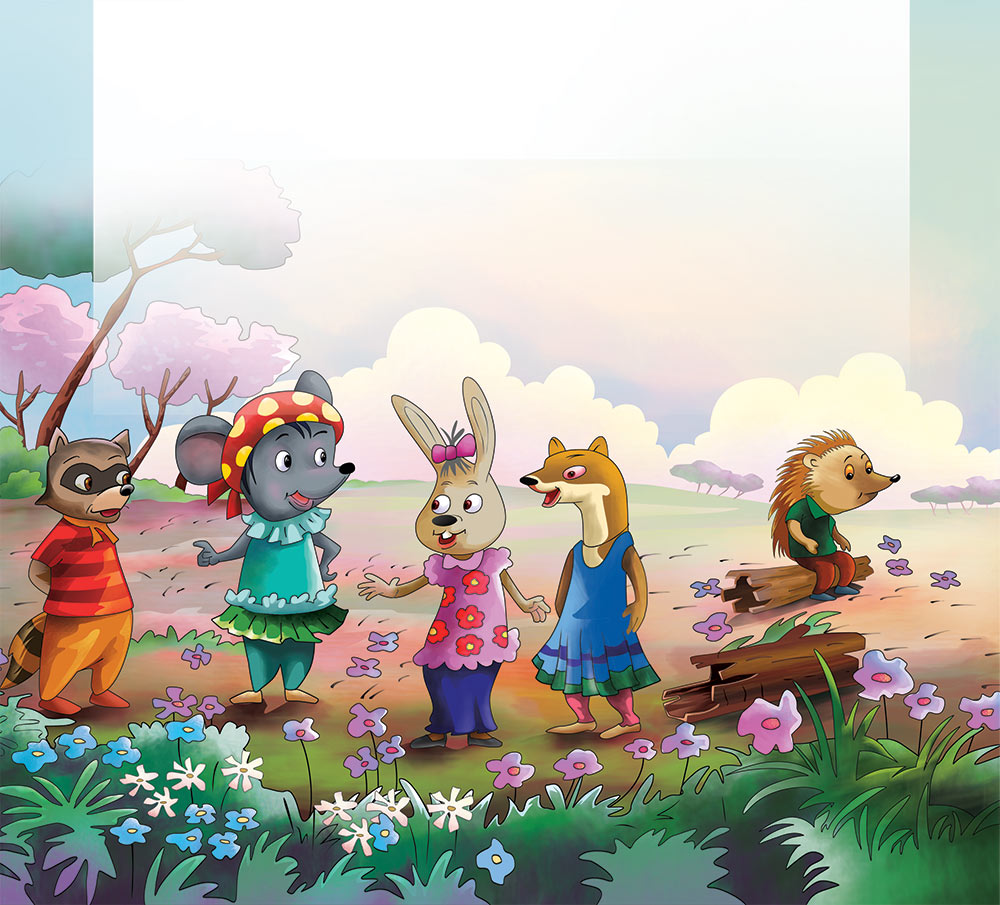

Example 5: book 17 (https://monkeypen.com/blogs/news/there-is-a-mouse-in-the-house-free-children-book), paragraph 0
There’s a mouse in the house and I saw him today. He ran across the floor as I started to play. There’s a mouse in the house; now, how can that be?.He stood on the table right by the TV. There’s a mouse in the house and I named him Ned. Since I gave him a name, he sleeps in my bed. “Hey mom,” Gretchen shouted from her room. “I just wrote a great poem.”


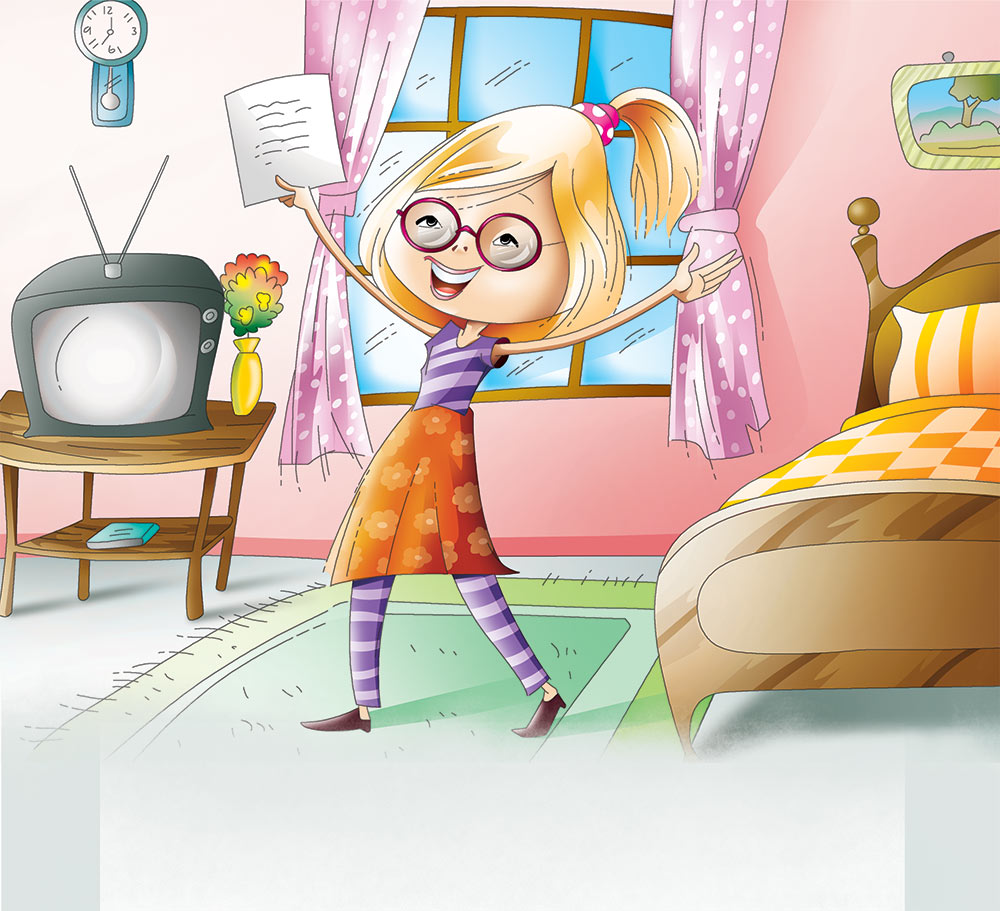

Example 6: book 7 (https://monkeypen.com/blogs/news/i-found-a-frog-free-children-book), paragraph 6
When I got home, my mother had an old fish bowl filled with water sitting on the corner of my desk.She asked to see the fish, looked, and with a big smile said, 
“Tadpoles. – Wow! You are in for a surprise.”


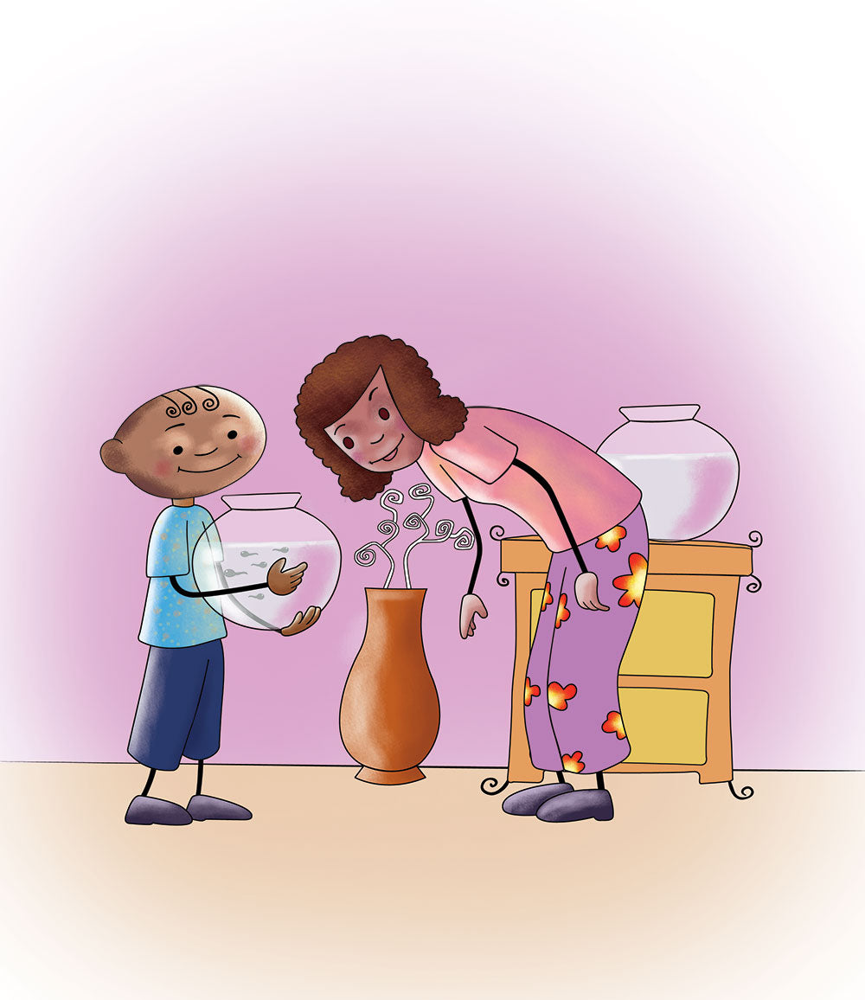

Example 7: book 4 (https://monkeypen.com/blogs/news/do-you-wonder-why-bugs-are-good-free-children-book), paragraph 0
Little Betty was walking through their vegetable garden when all of a sudden she began to scream.“Bugs, ugly creepy bugs!They’re all over the place.”


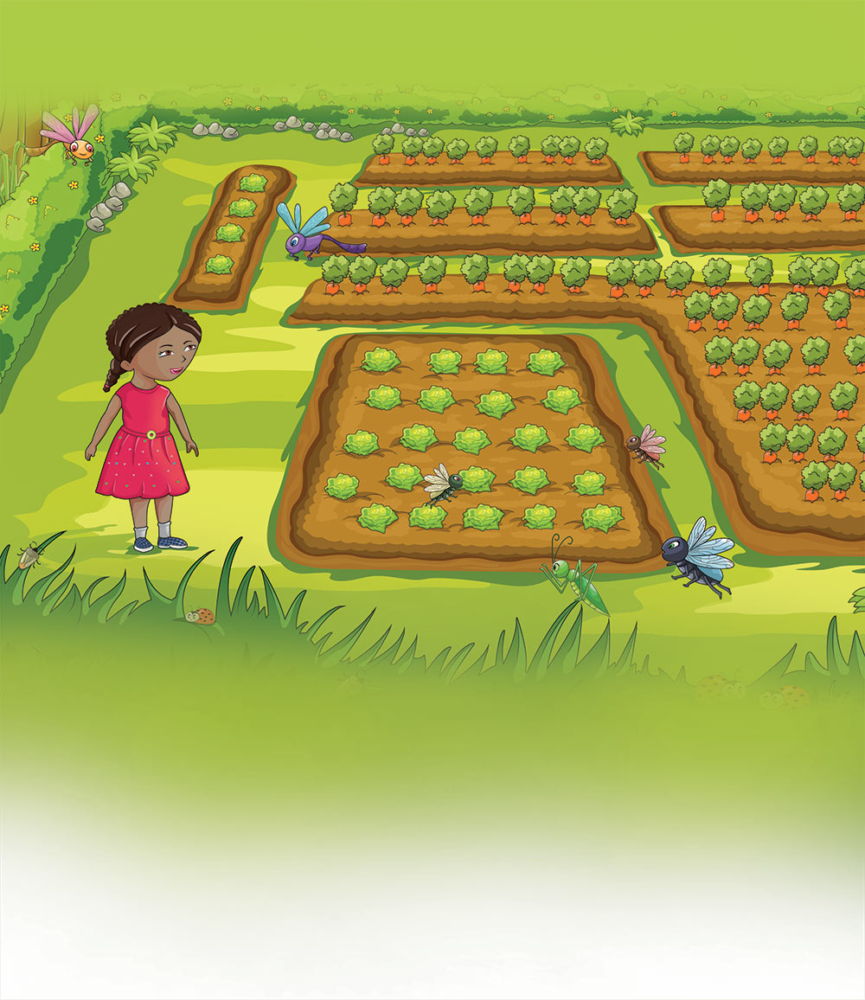

Example 8: book 9 (https://monkeypen.com/blogs/news/the-lunker-free-children-book), paragraph 11
I tried so hard, my arms were sore.


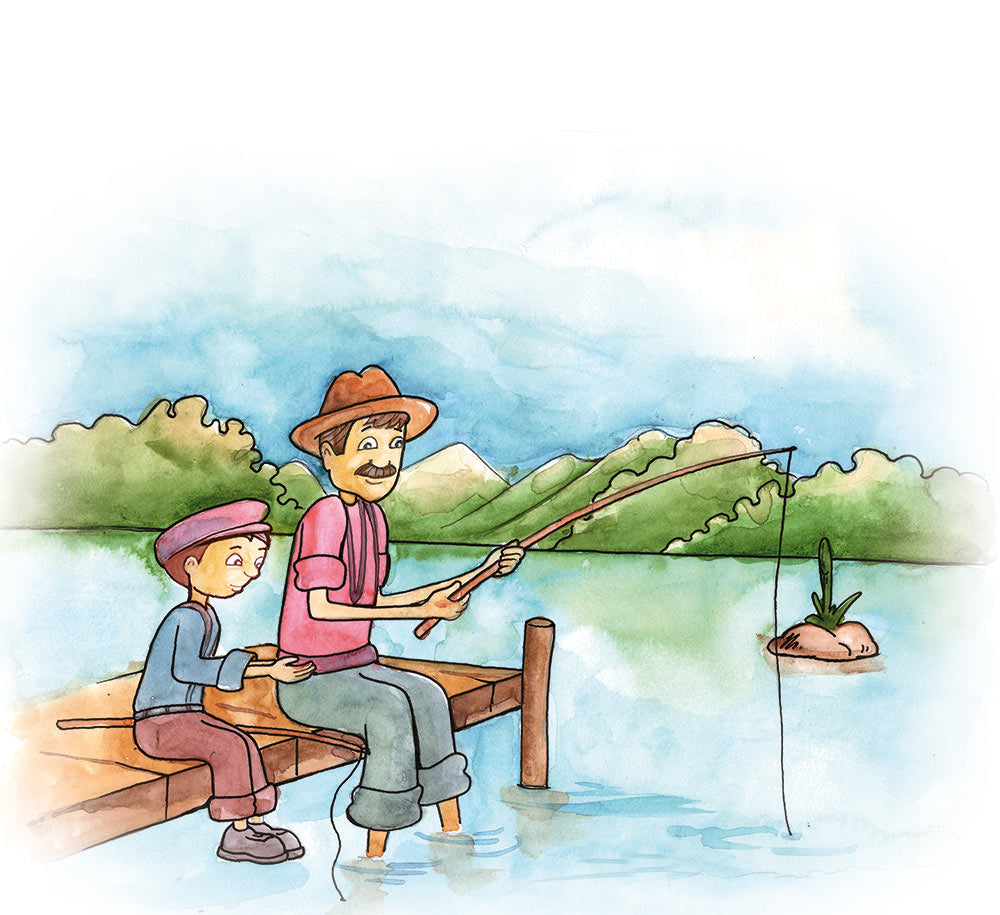

Example 9: book 33 (https://monkeypen.com/blogs/news/up-in-the-air-free-children-book), paragraph 8
Get your kite, get your balloon And fly it into the sky. Watch it bob and dive and dance Against the clouds that float by. So when you stand at your window,
Look up and down and all around. There are many, many things up in the air
Just as there are on the ground.


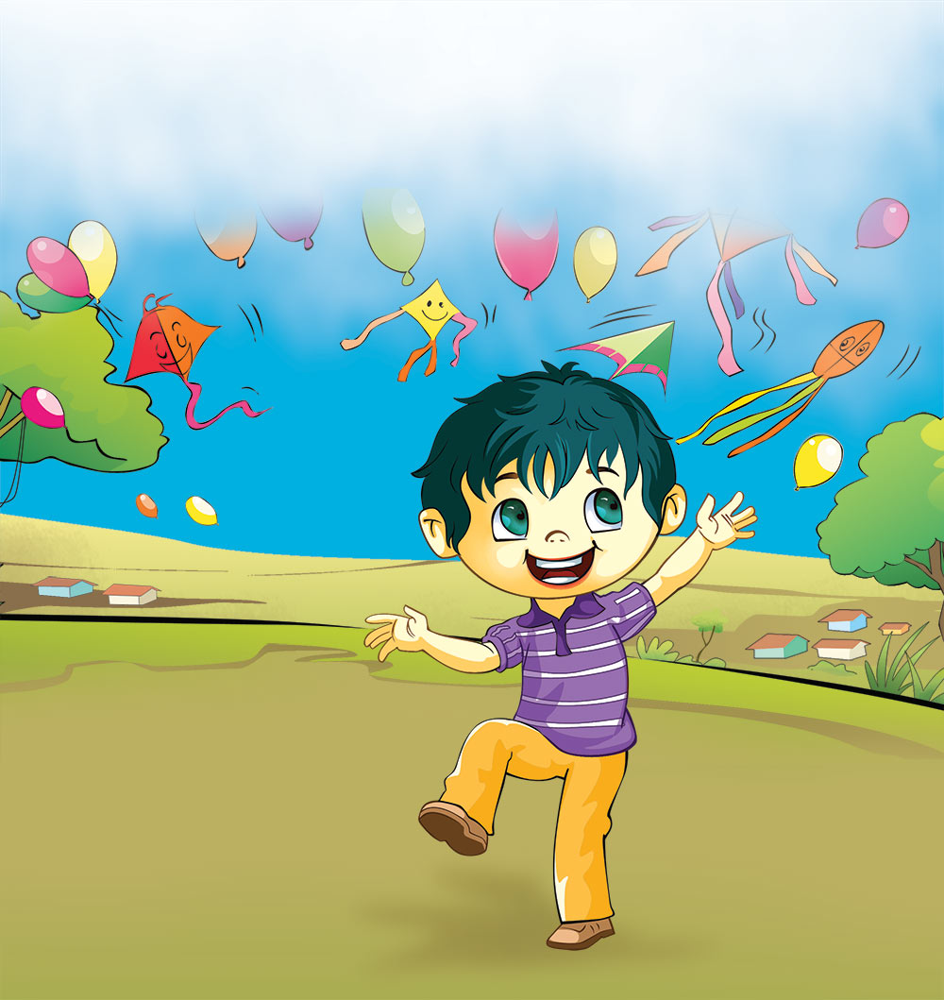

Example 10: book 32 (https://monkeypen.com/blogs/news/jessie-the-rabbit-free-children-book), paragraph 11
The Jessie was very scared but he couldn’t just leave Teddy there. Huffing and puffing, he rushed with incredible speed towards the Teddy. ‘Jessie, please, you need to find a way to get this thing off!’ said Teddy. Jessie started running around, looking for a way to help.


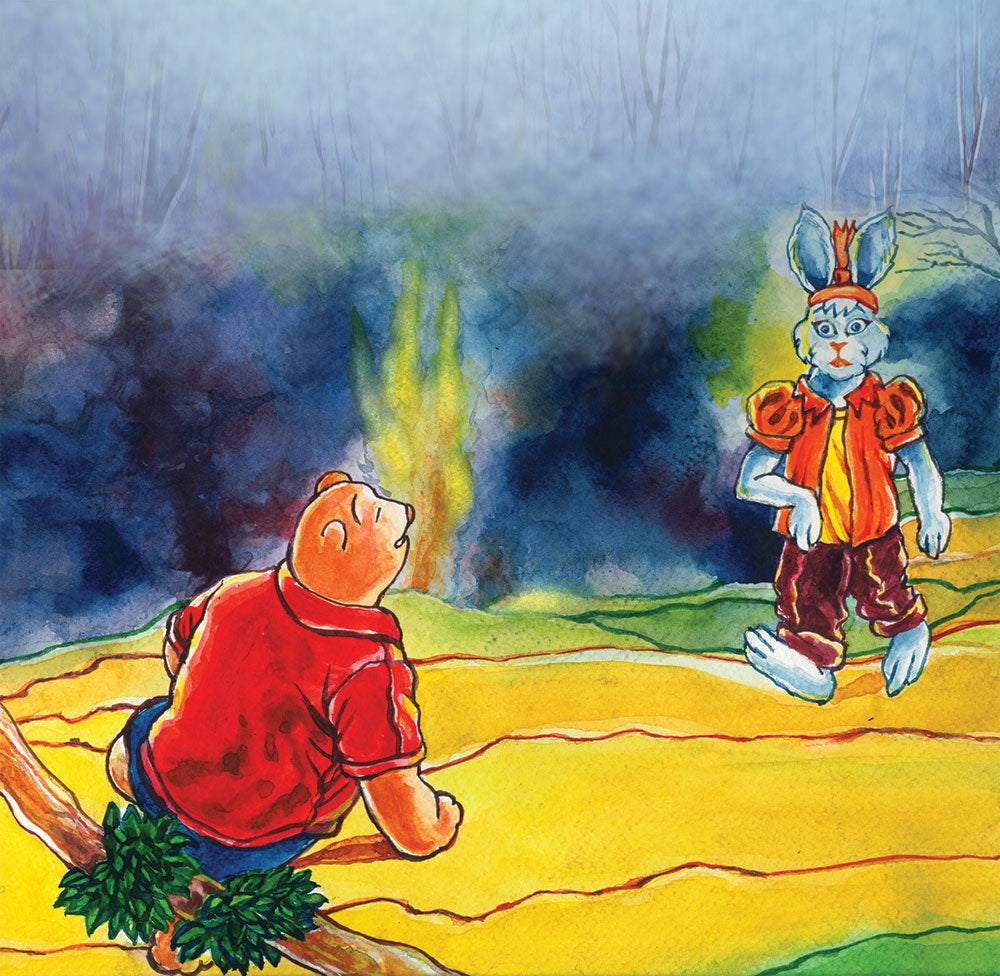

Example 11: book 12 (https://monkeypen.com/blogs/news/marty-mongoose-free-children-book), paragraph 12
Henrietta thought for a minute, smiled, and then flew off to talk with the other herons. Soon the herons had captured all the fish, crayfish (even poor Carl) and made the trail of food between the snake’s den and the home of the mongoose. Then they returned to their nests to watch.


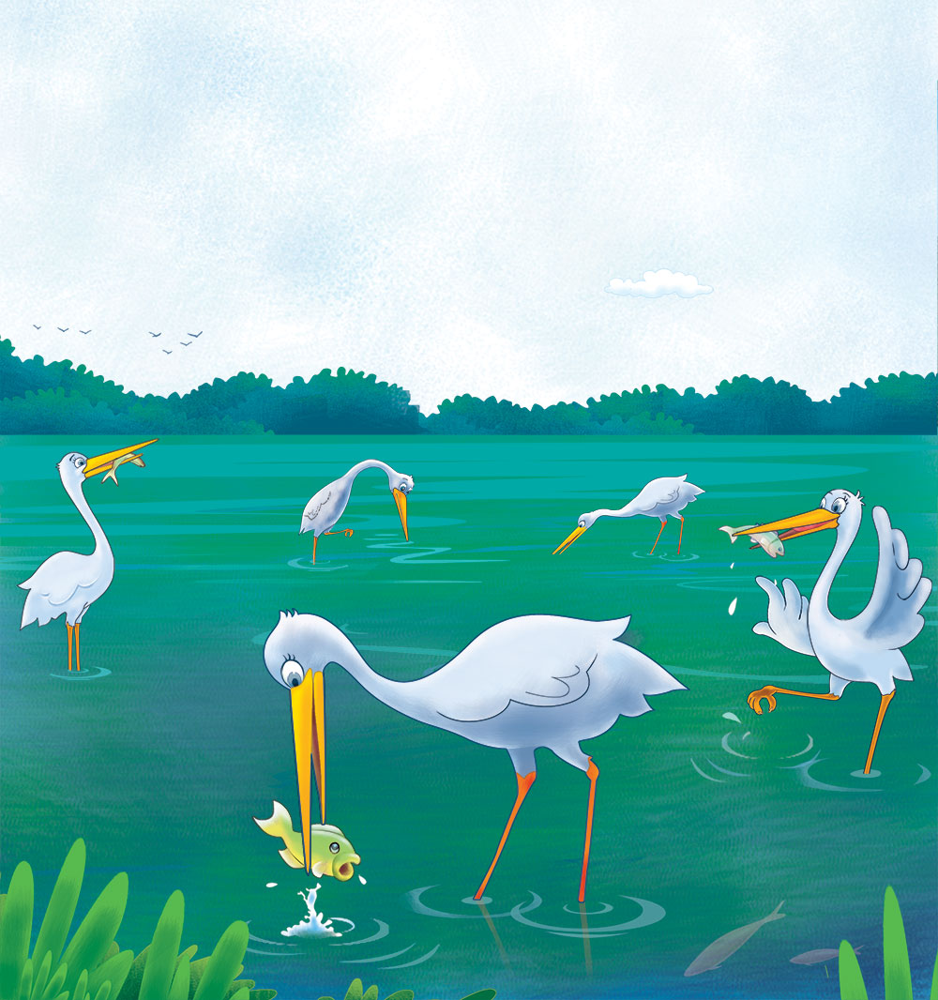

Example 12: book 36 (https://monkeypen.com/blogs/news/the-flower-garden-free-children-book), paragraph 20
“We have a surprise for you! You are going to have a baby brother soon. And your dad and I know you will take care of him as well as you take care of your gardens. Aren’t you girls excited?” Rose and Violet just stood there. They didn’t know what to say. All these years they were a family of four, and now there was going to be a strange fifth member. Another member that would need his parent’s love. Love that should be theirs, and they did not know if they wanted to share.


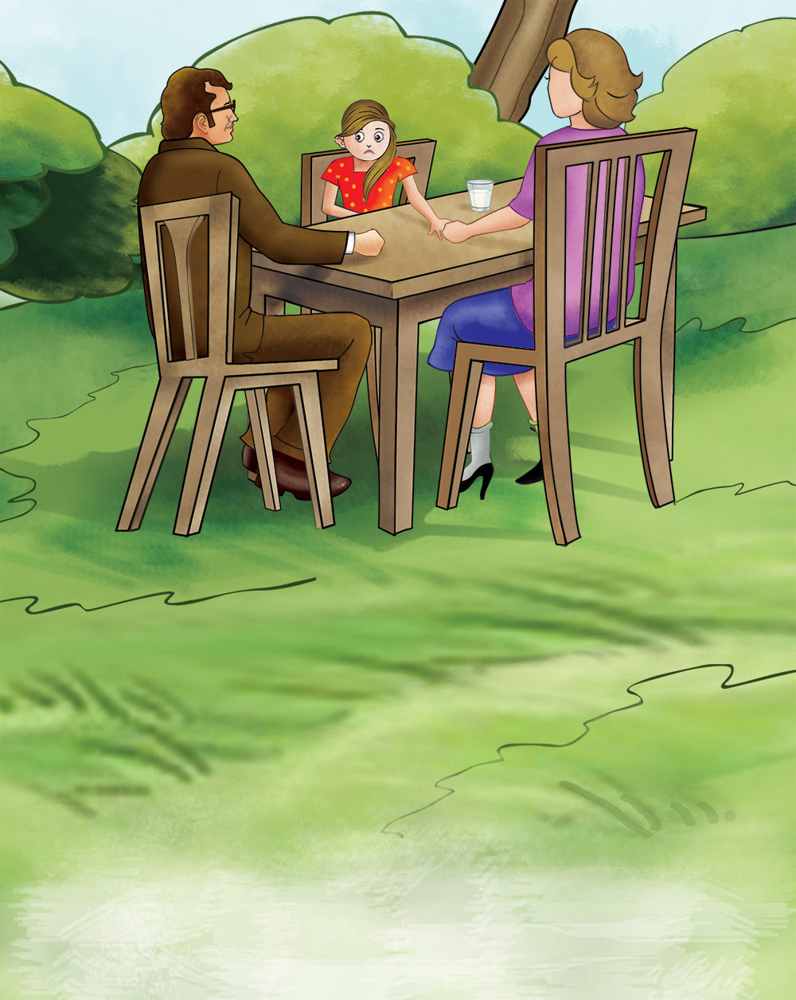

Example 13: book 24 (https://monkeypen.com/blogs/news/my-new-math-trick-free-children-book), paragraph 17
Go ahead and try a few.
11 X 12 =
The answer equals 1 (1+2) 2 or 132.
11 X 26 =
The answer equals 2 (2+6) 6 or 286.
11 X 81 =
The answer equals 8 (8+1) 1 or 891.
You didn’t know you were so smart, did you.


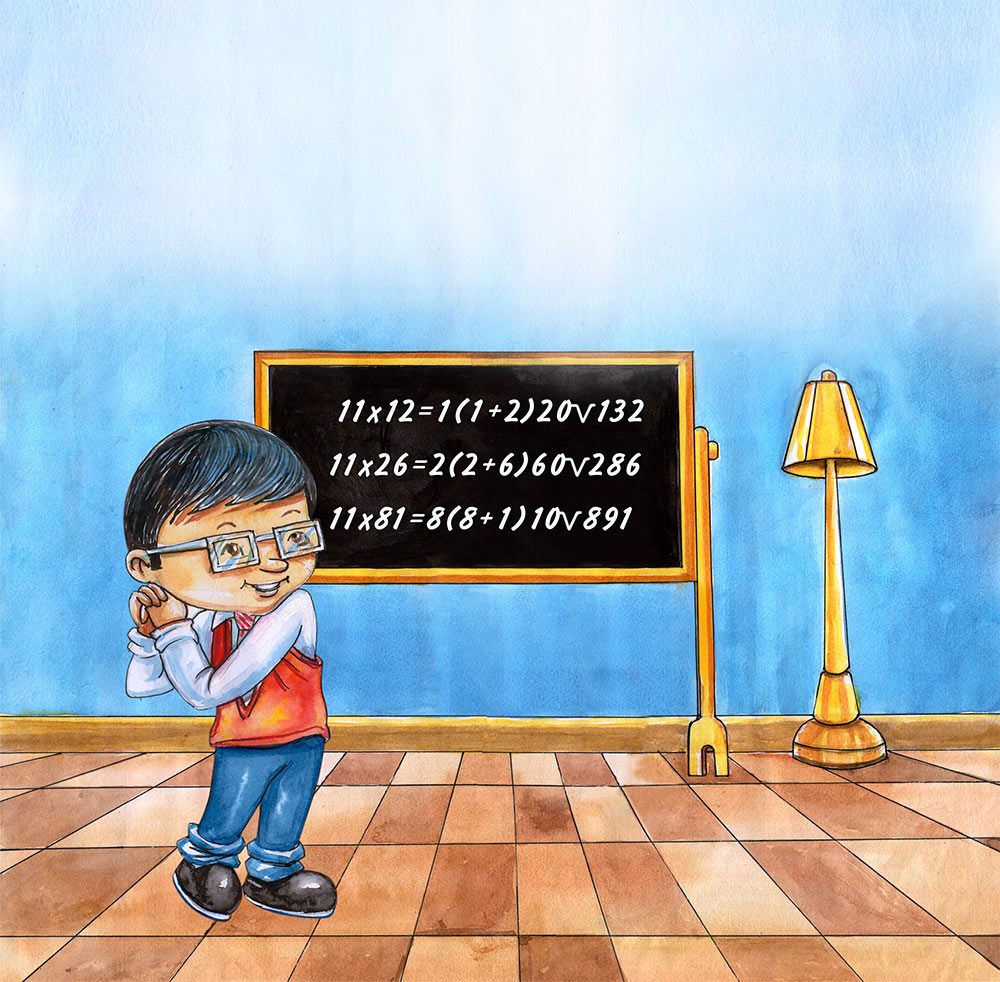

Example 14: book 9 (https://monkeypen.com/blogs/news/the-lunker-free-children-book), paragraph 12
Sunday morning we were there very fast.


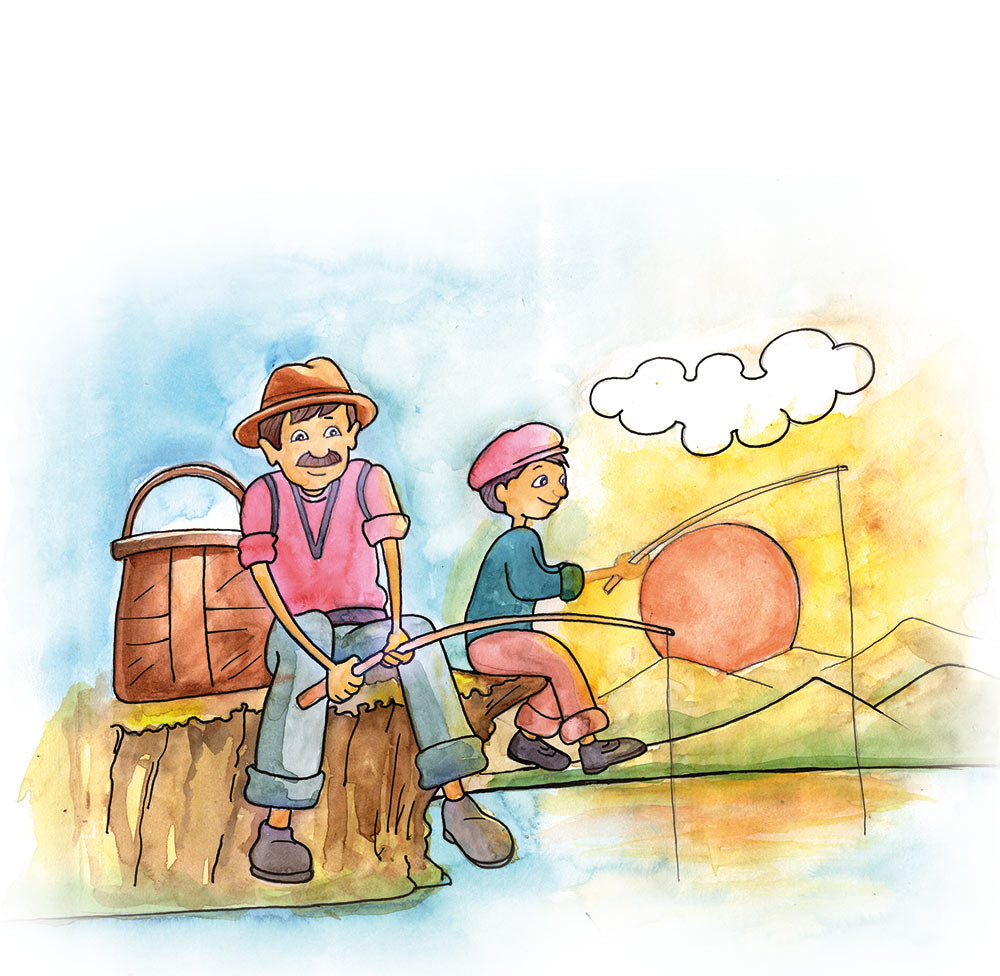

In [52]:
import random
import urllib.request
from PIL import Image

n_examples = 15

for i in range(n_examples):
  book_idx = random.randint(0, len(books)-1)
  book = books[book_idx]
  book_url = book['book_url']
  pairs = list(zip(book['book_img'], book['book_txt']))
  pair_idx = random.randint(0, len(pairs)-1)
  pair = pairs[pair_idx]

  print(f'\nExample {i}: book {book_idx} ({book_url}), paragraph {pair_idx}')
  print(pair[1])
  urllib.request.urlretrieve(pair[0], f"{i}.png")
  Img = Image.open(f"{i}.png")
  display(Img)


## Debugging

In [24]:
books[10]

{'book_txt': ['<img alt="Free Children\'s Book" src="https://cdn.shopify.com/s/files/1/2081/8163/files/01_937524cd-4446-401f-9a8a-ca9f9c335689.jpg?v=1613459119"/>',
  'Jimmy had just turned 5 and was starting school.',
  'He was frightened. He had never been to school before.',
  'Jimmy did not know what to expect and he did not want to leave home by himself.',
  "Jimmy's Mom told him not to be afraid as she walked him to his bus stop.",
  'She told him he would make new friends and have lots of fun.',
  'Jimmy was being brave as he got on the bus and sat down.'],
 'book_img': ['https://cdn.shopify.com/s/files/1/2081/8163/files/illus_02.jpg?v=1606471777',
  'https://cdn.shopify.com/s/files/1/2081/8163/files/illus_03.jpg?v=1606471793',
  'https://cdn.shopify.com/s/files/1/2081/8163/files/illus_04.jpg?v=1606471807',
  'https://cdn.shopify.com/s/files/1/2081/8163/files/illus_05.jpg?v=1606471829',
  'https://cdn.shopify.com/s/files/1/2081/8163/files/illus_06.jpg?v=1606471867',
  'https://c

In [35]:
URL = 'https://monkeypen.com/blogs/news/jimmys-first-day-of-school-free-children-book'
page = requests.get(URL)
book_soup = BeautifulSoup(page.content, "html.parser")
is_book_active = False
last_turn = 'image'
book_txt = []
book_img = []
results = book_soup.find_all(['div', 'p'], style=['text-align: left;', 'text-align: start;',''])
for res in results: # res is an html line
  # Check if the html is book story
  if (
    (res.name == 'p') and
    (len(res.contents) > 0)
  ):
    if (
      (
        ('contents' in vars(res.contents[0]).keys()) and
        (len(res.contents[0].contents) > 1) and
        (any(str(cont).find('Click here to read more Free') != -1 for cont in res.contents[0].contents))
      ) or
        any(str(cont).find('Click here to read more Free') != -1 for cont in res.contents)
    ):
      is_book_active = True
      continue
    elif (
      (
        ('contents' in vars(res.contents[0]).keys()) and
        (len(res.contents[0].contents) > 1) and
        (any(str(cont).find('Please share our books') != -1 for cont in res.contents[0].contents))
      ) or
        any(str(cont).find('Please share our books') != -1 for cont in res.contents)
    ):
      is_book_active = False
      break

  if is_book_active: # Book pages html
    # Check images
    print('\n', res)
    if (
      (len(res.contents) > 0) and 
      (
        ('attrs' in vars(res.contents[0]).keys()) and
        ('src' in res.contents[0].attrs.keys())
      ) or
      (
        (len(res.contents) > 1) and
        ('attrs' in vars(res.contents[1]).keys()) and
        ('src' in res.contents[1].attrs.keys())
      )
    ): # Extract image link
      try:
        image_link = res.contents[0]['src']
      except:
        image_link = res.contents[1]['src']
      book_img.append(image_link)
      last_turn = 'image'
      print('Generated image:', image_link)
    elif (
      (len(res.contents) > 0) and 
      (
        ('contents' in vars(res.contents[0]).keys()) and
        (len(res.contents[0].contents) > 0) and
        ('attrs' in vars(res.contents[0].contents[0]).keys()) and
        ('src' in res.contents[0].contents[0].attrs.keys())  
      )
    ): # Extract image link
      image_link = res.contents[0].contents[0]['src']
      book_img.append(image_link)
      last_turn = 'image'
      print('Generated image:', image_link)

    # Extract text
    else: 
      text = get_text(res)
      print('Generated text:', text)
      if len(text) > 0:
        if last_turn == 'text': # Add to previous text chunk
          book_txt[-1] += '\n' + text
        else: # Add as new text chunk
          book_txt.append(text)
          last_turn = 'text'

# {'book_txt': book_txt[:], 'book_img': book_img[1:]} # The first image is book cover


 <p style="text-align: left;"> </p>
Generated text: 

 <p style="text-align: left;"> <img alt="Free Children's Book" src="https://cdn.shopify.com/s/files/1/2081/8163/files/01_937524cd-4446-401f-9a8a-ca9f9c335689.jpg?v=1613459119"/></p>
Generated image: https://cdn.shopify.com/s/files/1/2081/8163/files/01_937524cd-4446-401f-9a8a-ca9f9c335689.jpg?v=1613459119

 <div style="text-align: left;"><img alt="Free Children's Book" src="https://cdn.shopify.com/s/files/1/2081/8163/files/illus_01.jpg?v=1606471764" style="float: none;"/></div>
Generated image: https://cdn.shopify.com/s/files/1/2081/8163/files/illus_01.jpg?v=1606471764

 <p style="text-align: left;">Jimmy had just turned 5 and was starting school.</p>
Generated text: Jimmy had just turned 5 and was starting school.

 <div style="text-align: left;"><img alt="Free Children's Book" src="https://cdn.shopify.com/s/files/1/2081/8163/files/illus_02.jpg?v=1606471777" style="float: none;"/></div>
Generated image: https://cdn.shopify.com/s/fi